In [1]:
# Load data/Restart
%load_ext autoreload
%autoreload 2
import os
import sys
import anndata as ad
import pandas as pd
import scanpy as sc
import anndata as ad
import numpy as np
import spagrn
from spagrn.network import Network  # Import the Network class
from pyscenic.aucell import aucell
from scipy.spatial.distance import jensenshannon
from spagrn.plot_GRN import *
from spagrn.plot_Regulon import *
import spagrn.hotspot
import spagrn.regulatory_network

seu = ad.read_h5ad('/Users/linliu/Library/CloudStorage/Box-Box/linliu/AVFpy/seu_AVF.h5ad')

/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [4]:
import os
import sys
import pandas as pd
import scanpy as sc
import anndata as ad
import numpy as np
import spagrn
from spagrn.network import Network  # Import the Network class
from pyscenic.aucell import aucell
from scipy.spatial.distance import jensenshannon
import spagrn.hotspot
import spagrn.regulatory_network

# Load data
seu = ad.read_h5ad('/Users/linliu/Library/CloudStorage/Box-Box/linliu/AVFpy/seu_AVF.h5ad')


# Preprocess data
seu.X = seu.layers['counts']
seu.layers['counts'] = seu.layers['counts'].tocsc()
seu.obs['total_counts'] = np.sum(seu.layers['counts'], axis=1)
sc.pp.normalize_total(seu, target_sum=1e4)
sc.pp.log1p(seu)
seu = Network.preprocess(seu, min_genes=5, min_cells=20, min_counts=20, max_gene_num=4000)


# Load input files
tfs_fn = r'/Users/linliu/Library/CloudStorage/OneDrive-AugustaUniversity/GRN Analysis Input Resources/allTFs_hg38.txt'
database_fn = r'/Users/linliu/Library/CloudStorage/OneDrive-AugustaUniversity/GRN Analysis Input Resources/hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather'
motif_anno_fn = r'/Users/linliu/Library/CloudStorage/OneDrive-AugustaUniversity/GRN Analysis Input Resources/motifs-v10nr_clust-nr.hgnc-m0.001-o0.0.tbl'
niches = pd.read_csv(r'/Users/linliu/Library/CloudStorage/OneDrive-AugustaUniversity/GRN Analysis Input Resources/lr_network_human.csv')


grn = spagrn.regulatory_network.InferNetwork(adata=seu, project_name="AVF_GRN")
grn.infer(
        database_fn,
        motif_anno_fn,
        tfs_fn,
        niche_df=niches,
        num_workers=12,
        cache=False,
        save_tmp=True,
        latent_obsm_key='spatial',
        model='bernoulli',
        n_neighbors=300, #Increase n_neighbors to capture broader spatial relationships
        cluster_label='leiden_cb_1.0',
        layers='counts',
        umi_counts_obs_key="total_counts",
        batch_key='Sample',
        #combine=True, #combined FDR across the four metrics (Moran's I, Geary's C, Getis-Ord G*, Hotspot) using Fisher's method 
        operation='union',  # 'union' or 'intersection'
        #local=True, #SOMDE p-values instead of global metrics
    )

----------------------------------------
Project name is AVF_GRN
Batch correction enabled using key: Sample
Saving output files into /Users/linliu/NewSpaGRN/src/spagrn
Saving temporary files to /Users/linliu/NewSpaGRN/src/spagrn/tmp_files
----------------------------------------


/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely

Computing batch-aware spatial weights with batch key: Sample
Computing Moran's I...


/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely

Computing Geary's C...
Computing Getis G...
global spatial gene num (union): 989
Current mode is moran
Using batch correction with batch key: Sample


/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/linliu/miniconda3/envs/newspagrn/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely

run_in_parallel_m: Total time taken: 1331.0736 seconds



2025-09-20 16:15:33,719 - pyscenic.utils - INFO - Calculating Pearson correlations.

2025-09-20 16:15:33,726 - pyscenic.utils - WARNING - Note on correlation calculation: the default behaviour for calculating the correlations has changed after pySCENIC verion 0.9.16. Previously, the default was to calculate the correlation between a TF and target gene using only cells with non-zero expression values (mask_dropouts=True). The current default is now to use all cells to match the behavior of the R verision of SCENIC. The original settings can be retained by setting 'rho_mask_dropouts=True' in the modules_from_adjacencies function, or '--mask_dropouts' from the CLI.
	Dropout masking is currently set to [False].

2025-09-20 16:15:34,230 - pyscenic.utils - INFO - Creating modules.


[                                        ] | 0% Completed | 5.94 s ms


2025-09-20 16:15:41,559 - pyscenic.transform - WARNING - Less than 80% of the genes in Regulon for DNMT3A could be mapped to hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather. Skipping this module.


[                                        ] | 0% Completed | 11.10 s


2025-09-20 16:15:46,725 - pyscenic.transform - WARNING - Less than 80% of the genes in Regulon for NR4A1 could be mapped to hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather. Skipping this module.


[                                        ] | 0% Completed | 23.29 s


2025-09-20 16:15:58,897 - pyscenic.transform - WARNING - Less than 80% of the genes in Regulon for POU5F1 could be mapped to hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather. Skipping this module.


[                                        ] | 0% Completed | 30.11 s


2025-09-20 16:16:05,709 - pyscenic.transform - WARNING - Less than 80% of the genes in Regulon for DNMT3A could be mapped to hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather. Skipping this module.


[                                        ] | 0% Completed | 36.06 s


2025-09-20 16:16:11,630 - pyscenic.transform - WARNING - Less than 80% of the genes in Regulon for POU5F1 could be mapped to hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather. Skipping this module.


[                                        ] | 0% Completed | 58.17 s


2025-09-20 16:16:33,733 - pyscenic.transform - WARNING - Less than 80% of the genes in DNMT3A could be mapped to hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather. Skipping this module.


[########################################] | 100% Completed | 69.35 s
Create regulons from a dataframe of enriched features.
Additional columns saved: []
Computing regulon specificity scores without batch correction


AnnData object with n_obs × n_vars = 49430 × 989
    obs: 'nCount_RNA', 'nFeature_RNA', 'fov', 'nCount_negprobes', 'nFeature_negprobes', 'Area', 'AspectRatio', 'Width', 'Height', 'CenterX_global_px', 'CenterY_global_px', 'Mean.PanCK', 'Max.PanCK', 'Mean.G', 'Max.G', 'Mean.Membrane', 'Max.Membrane', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'AtmxCluster', 'percent.NegPrb', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'coarse_annotation', 'Sample', 'condition', 'AVF', 'FBL_SMC', 'n_counts', '_scvi_batch', '_scvi_labels', 'leiden_0.5', 'leiden_niche_0.5', 'leiden_niche_1.0', 'leiden_niche_0.7', 'ATF3_exp', 'proliferation_score', 'ATF3_related_score', 'total_counts', 'Module 1', 'Module 2', 'Module 3', 'Module 4', 'Module 5', 'Module 6', 'Module 7', 'Module 8', 'n_genes', 'leiden_cb_0.5', 'leiden_cb_1.0', 'leiden_cb_2.0', 'unk_cb_0.1', 'imm_cb_0.1'
    var: 'r2_z', 'r2_s', 'mean', 'std', 'n_cells', 'n_counts'
    uns: 'ATF3_exp_colors', 'Sample_colors', '_scvi_manager_uuid', '_

In [5]:
seu.write_h5ad('/Users/linliu/Library/CloudStorage/Box-Box/linliu/AVFpy/seu_AVF.h5ad')

In [6]:
seu.obsm['auc_mtx']

Regulon,ATF3(+),CLOCK(+),ETS1(+),FOS(+),GFI1(+),HEY1(+),JUN(+),JUNB(+),KLF4(+),MAF(+),...,POU5F1(+),RARA(+),RXRA(+),SPI1(+),STAT1(+),STAT3(+),STAT5B(+),STAT6(+),TWIST1(+),XBP1(+)
c_1_1_2,0.013024,0.156034,0.009252,0.007829,0.000000,0.000000,0.011565,0.008106,0.109364,0.000000,...,0.000000,0.013395,0.000000,0.000345,0.000000,0.004754,0.011359,0.000000,0.150222,0.048204
c_1_1_4,0.008619,0.139699,0.002135,0.021507,0.013200,0.202018,0.028324,0.020263,0.001729,0.005505,...,0.015478,0.000000,0.000000,0.013482,0.000000,0.000000,0.002621,0.000000,0.197865,0.010906
c_1_1_5,0.001446,0.219131,0.149685,0.024120,0.004896,0.107197,0.040115,0.017925,0.038883,0.025651,...,0.080109,0.005054,0.011255,0.017004,0.029966,0.014331,0.101975,0.073310,0.202856,0.087002
c_1_1_6,0.004544,0.544698,0.012810,0.004777,0.000000,0.400814,0.014453,0.009558,0.010375,0.004819,...,0.003515,0.000000,0.000000,0.004739,0.000000,0.000000,0.038802,0.000000,0.514517,0.000000
c_1_1_7,0.000000,0.423683,0.038108,0.008286,0.000000,0.568459,0.029500,0.021344,0.058247,0.006091,...,0.000000,0.000000,0.000000,0.004645,0.013063,0.000000,0.000000,0.005187,0.555798,0.003960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c_1_187_503,0.647082,0.084801,0.068566,0.411990,0.000000,0.000000,0.032269,0.254026,0.025361,0.000000,...,0.035718,0.008193,0.000000,0.005107,0.458065,0.000000,0.075368,0.000000,0.081643,0.000000
c_1_187_514,0.009500,0.094977,0.012810,0.013574,0.000000,0.000000,0.000000,0.009805,0.010375,0.005362,...,0.003515,0.000000,0.000000,0.000696,0.000000,0.000000,0.017113,0.000000,0.091440,0.000000
c_1_187_515,0.059391,0.000000,0.052932,0.099694,0.000000,0.000000,0.117980,0.392107,0.000000,0.041812,...,0.025137,0.034771,0.003596,0.022638,0.011718,0.010314,0.050280,0.031225,0.000000,0.042949
c_1_187_517,0.003304,0.078017,0.034403,0.017454,0.006960,0.000000,0.007281,0.014989,0.089404,0.000000,...,0.066838,0.011589,0.000000,0.000288,0.008384,0.011006,0.062917,0.086667,0.075111,0.000000


In [7]:
seu.obsm['rep_auc_mtx']

,ATF3,FOS,JUN,JUNB,KLF2,KLF4,MYC,TCF7
Cell,,,,,,,,
c_1_1_2,0.0,0.0000,0.0000,0.06250,0.06250,0.00000,0.0000,0.048611
c_1_1_4,0.0,0.0000,0.0000,0.00000,0.00000,0.00000,0.0000,0.000000
c_1_1_5,0.0,0.0000,0.0000,0.00000,0.00000,0.00000,0.0000,0.020833
c_1_1_6,0.0,0.0000,0.0000,0.00000,0.00000,0.00000,0.0000,0.097222
c_1_1_7,0.0,0.1375,0.1375,0.21875,0.21875,0.34375,0.0000,0.381944
...,...,...,...,...,...,...,...,...
c_1_187_503,0.0,0.0000,0.0000,0.00000,0.00000,0.00000,0.0000,0.000000
c_1_187_514,0.0,0.0000,0.0000,0.00000,0.00000,0.00000,0.0000,0.000000
c_1_187_515,0.0,0.0375,0.0375,0.03125,0.03125,0.00000,0.0375,0.000000


In [8]:
seu.obsm['isr']

,ATF3(+),CLOCK(+),ETS1(+),FOS(+),GFI1(+),HEY1(+),JUN(+),JUNB(+),KLF4(+),MAF(+),...,POU5F1(+),RARA(+),RXRA(+),SPI1(+),STAT1(+),STAT3(+),STAT5B(+),STAT6(+),TWIST1(+),XBP1(+)
c_1_1_2,0.013024,0.208117,0.026693,0.036675,0.000000,0.048611,0.058440,0.034891,0.159364,0.062500,...,0.000000,0.047485,0.034091,0.000345,0.068182,0.029754,0.055476,0.026786,0.184945,0.101775
c_1_1_4,0.008619,0.139699,0.013763,0.021507,0.013200,0.202018,0.028324,0.020263,0.026729,0.036755,...,0.049569,0.000000,0.019886,0.013482,0.000000,0.012500,0.002621,0.013393,0.197865,0.037691
c_1_1_5,0.001446,0.219131,0.152592,0.024120,0.004896,0.107197,0.040115,0.017925,0.038883,0.025651,...,0.080109,0.005054,0.011255,0.017004,0.029966,0.014331,0.101975,0.073310,0.202856,0.087002
c_1_1_6,0.004544,0.555115,0.012810,0.004777,0.000000,0.491091,0.014453,0.009558,0.010375,0.004819,...,0.003515,0.000000,0.000000,0.004739,0.000000,0.022917,0.038802,0.000000,0.521461,0.000000
c_1_1_7,0.000000,0.809100,0.038108,0.008286,0.000000,0.825403,0.029500,0.021344,0.095747,0.006091,...,0.000000,0.000000,0.000000,0.004645,0.013063,0.022917,0.000000,0.029740,0.889131,0.003960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c_1_187_503,0.647082,0.084801,0.083101,0.416798,0.000000,0.000000,0.040082,0.258490,0.033695,0.000000,...,0.035718,0.013874,0.028409,0.005107,0.469429,0.004167,0.082721,0.004464,0.081643,0.008929
c_1_187_514,0.009500,0.094977,0.012810,0.013574,0.000000,0.000000,0.000000,0.009805,0.060375,0.005362,...,0.003515,0.000000,0.000000,0.000696,0.000000,0.000000,0.017113,0.000000,0.091440,0.000000
c_1_187_515,0.059391,0.000000,0.076188,0.109309,0.083333,0.000000,0.133605,0.401036,0.000000,0.041812,...,0.025137,0.046135,0.049051,0.022638,0.034445,0.018648,0.050280,0.040153,0.000000,0.042949
c_1_187_517,0.003304,0.078017,0.034403,0.017454,0.006960,0.000000,0.007281,0.014989,0.089404,0.000000,...,0.066838,0.011589,0.000000,0.000288,0.008384,0.011006,0.062917,0.086667,0.075111,0.000000


In [9]:
seu.uns['adj']

,TF,target,importance
0,TFEB,TNNC1,0.003301
1,TFEB,CLEC7A,0.002103
2,TFEB,CDKN3,0.002498
3,TFEB,CD2,0.002554
4,TFEB,CSF1R,-0.000708
...,...,...,...
86519,NR3C1,ACACB,0.003496
86520,NR3C1,RAMP2,0.008000
86521,NR3C1,COL6A3,0.008560
86522,NR3C1,CARMN,0.004912


In [10]:
print(min(seu.uns['adj']['importance']))
print(max(seu.uns['adj']['importance']))
print(np.quantile(seu.uns['adj']['importance'], [0.25, 0.5, 0.75]))

-0.044191533402215565
0.1191731802039976
[0.00177878 0.00299125 0.00476599]


<Figure size 800x600 with 0 Axes>

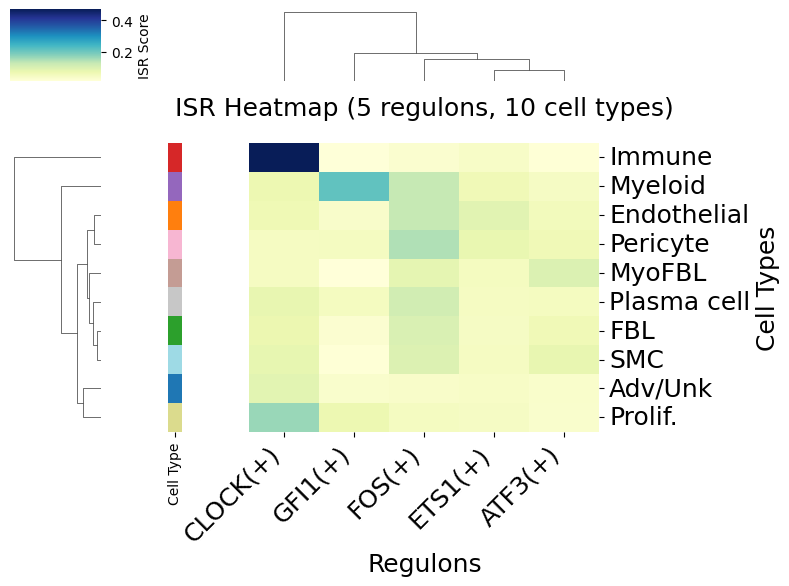

Heatmap created with:
  - 10 cell types: Adv/Unk, Endothelial, FBL, Immune, Myeloid, MyoFBL, Pericyte, Plasma cell, Prolif., SMC
  - 5 regulons
  - Data range: 0.013 to 0.472


,GFI1(+),ETS1(+),CLOCK(+),ATF3(+),FOS(+)
Adv/Unk,0.032307,0.041396,0.087261,0.034351,0.036474
Endothelial,0.034623,0.088843,0.066377,0.055210,0.128251
FBL,0.025561,0.044256,0.073505,0.062422,0.101512
Immune,0.015835,0.039296,0.472485,0.016471,0.027418
Myeloid,0.213315,0.062237,0.069608,0.044570,0.129335
MyoFBL,0.012848,0.049844,0.045667,0.098760,0.084522
Pericyte,0.047231,0.076485,0.045660,0.061740,0.147344
Plasma cell,0.049012,0.045302,0.078132,0.050209,0.112164
Prolif.,0.069652,0.044003,0.164394,0.031203,0.046990
SMC,0.017296,0.045757,0.079379,0.077938,0.095825


In [11]:
# Show top 5 (ranked by rss) regulons per cell type
from spagrn.plot_Regulon import isr_heatmap

isr_heatmap(
    seu,
    cluster_label='leiden_cb_1.0',
    isr_mtx=seu.obsm['isr'],
    rss_df=seu.uns['rss'],
    topn=5,  # Top 5 regulons per cell type
    figsize=(8, 6),
    cmap="YlGnBu",
    xticklabels=True,
    yticklabels=True
)

<Figure size 1600x600 with 0 Axes>

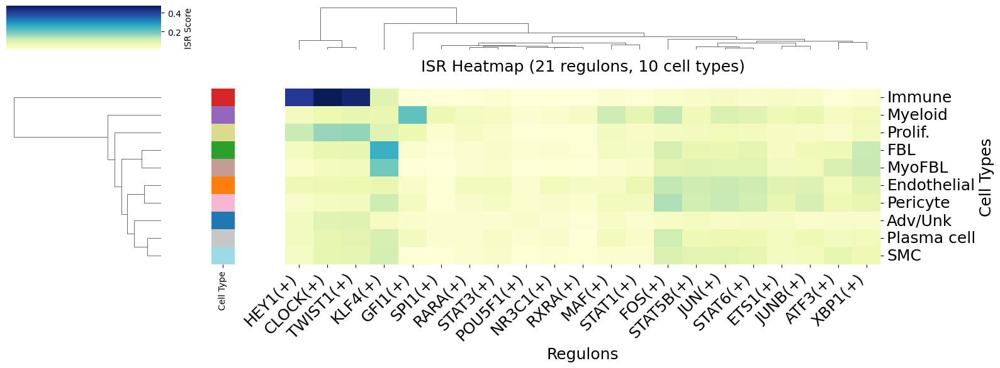

Heatmap created with:
  - 10 cell types: Adv/Unk, Endothelial, FBL, Immune, Myeloid, MyoFBL, Pericyte, Plasma cell, Prolif., SMC
  - 21 regulons
  - Data range: 0.011 to 0.472


,ATF3(+),CLOCK(+),ETS1(+),FOS(+),GFI1(+),HEY1(+),JUN(+),JUNB(+),KLF4(+),MAF(+),...,POU5F1(+),RARA(+),RXRA(+),SPI1(+),STAT1(+),STAT3(+),STAT5B(+),STAT6(+),TWIST1(+),XBP1(+)
Adv/Unk,0.034351,0.087261,0.041396,0.036474,0.032307,0.050133,0.038136,0.030036,0.043800,0.037738,...,0.034531,0.024853,0.017280,0.025717,0.027959,0.023813,0.045612,0.040846,0.091686,0.035365
Endothelial,0.055210,0.066377,0.088843,0.128251,0.034623,0.063452,0.121528,0.093042,0.074493,0.041201,...,0.028516,0.051858,0.042289,0.021536,0.072216,0.054089,0.116147,0.116754,0.069506,0.087479
FBL,0.062422,0.073505,0.044256,0.101512,0.025561,0.046331,0.072457,0.059088,0.252483,0.046179,...,0.022409,0.028058,0.018191,0.018057,0.042037,0.036150,0.076601,0.081335,0.077917,0.120109
Immune,0.016471,0.472485,0.039296,0.027418,0.015835,0.410599,0.040237,0.033026,0.086757,0.023832,...,0.012517,0.014870,0.011067,0.010962,0.020590,0.023262,0.034423,0.033307,0.450474,0.026202
Myeloid,0.044570,0.069608,0.062237,0.129335,0.213315,0.050225,0.095994,0.075788,0.072673,0.115960,...,0.026149,0.045755,0.040761,0.067705,0.081491,0.044937,0.059257,0.087118,0.079372,0.057759
MyoFBL,0.098760,0.045667,0.049844,0.084522,0.012848,0.031797,0.085535,0.052667,0.195685,0.023913,...,0.017477,0.025685,0.014959,0.011449,0.035892,0.032060,0.086707,0.086166,0.052055,0.125333
Pericyte,0.061740,0.045660,0.076485,0.147344,0.047231,0.034558,0.123869,0.101183,0.115326,0.051499,...,0.027908,0.033624,0.028593,0.018597,0.048838,0.042653,0.108383,0.108918,0.050129,0.077129
Plasma cell,0.050209,0.078132,0.045302,0.112164,0.049012,0.050408,0.067267,0.061935,0.104257,0.051949,...,0.024347,0.026103,0.015720,0.024441,0.036158,0.036219,0.062067,0.067724,0.083743,0.057095
Prolif.,0.031203,0.164394,0.044003,0.046990,0.069652,0.119334,0.056905,0.036302,0.086885,0.050567,...,0.018050,0.044634,0.020668,0.024634,0.037948,0.029280,0.050402,0.052421,0.168175,0.049879
SMC,0.077938,0.079379,0.045757,0.095825,0.017296,0.041634,0.085352,0.056354,0.104871,0.027869,...,0.019153,0.025599,0.018831,0.015140,0.028820,0.034619,0.083581,0.075944,0.082915,0.063318


In [12]:
# Show all regulons per cell type
from spagrn.plot_Regulon import isr_heatmap
isr_heatmap(
    seu,
    cluster_label='leiden_cb_1.0',
    isr_mtx=seu.obsm['isr'],  # Use directly - it's already a DataFrame
    rss_df=seu.uns['rss'],
    topn=None,  # Show all regulons
    figsize=(16, 6),
    cmap="YlGnBu",
    xticklabels=True,
    yticklabels=True,
    row_cluster=True,
    col_cluster=True
)

In [13]:
# Get network (TF->Target) significance range
import numpy as np
from spagrn.plot_GRN import get_network_summary

# Get the network summary
summary = get_network_summary(seu, receptor_source='receptor_dict')

# Extract and print the importance range
min_importance = summary.get('min_importance', None)
max_importance = summary.get('max_importance', None)

if min_importance is not None and max_importance is not None:
    print(f"Importance Range: {min_importance} to {max_importance}")
else:
    print("No importance data found in adata.uns['adj']")

Importance Range: -0.044191533402215565 to 0.1191731802039976


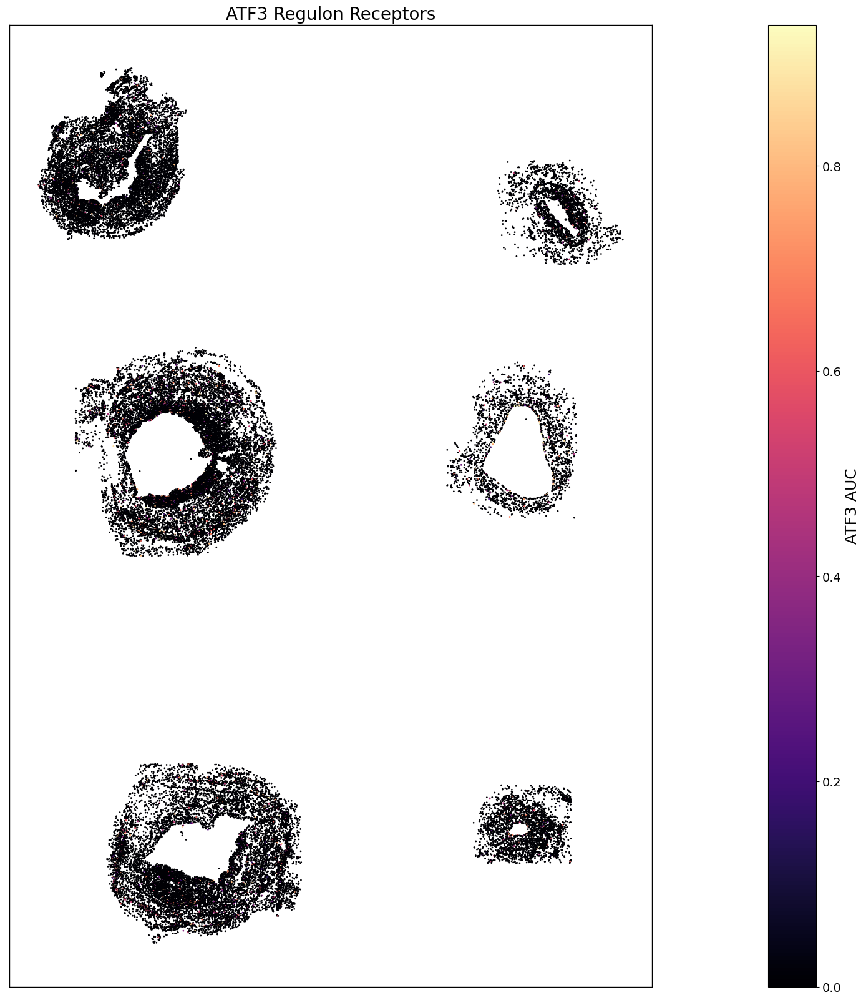

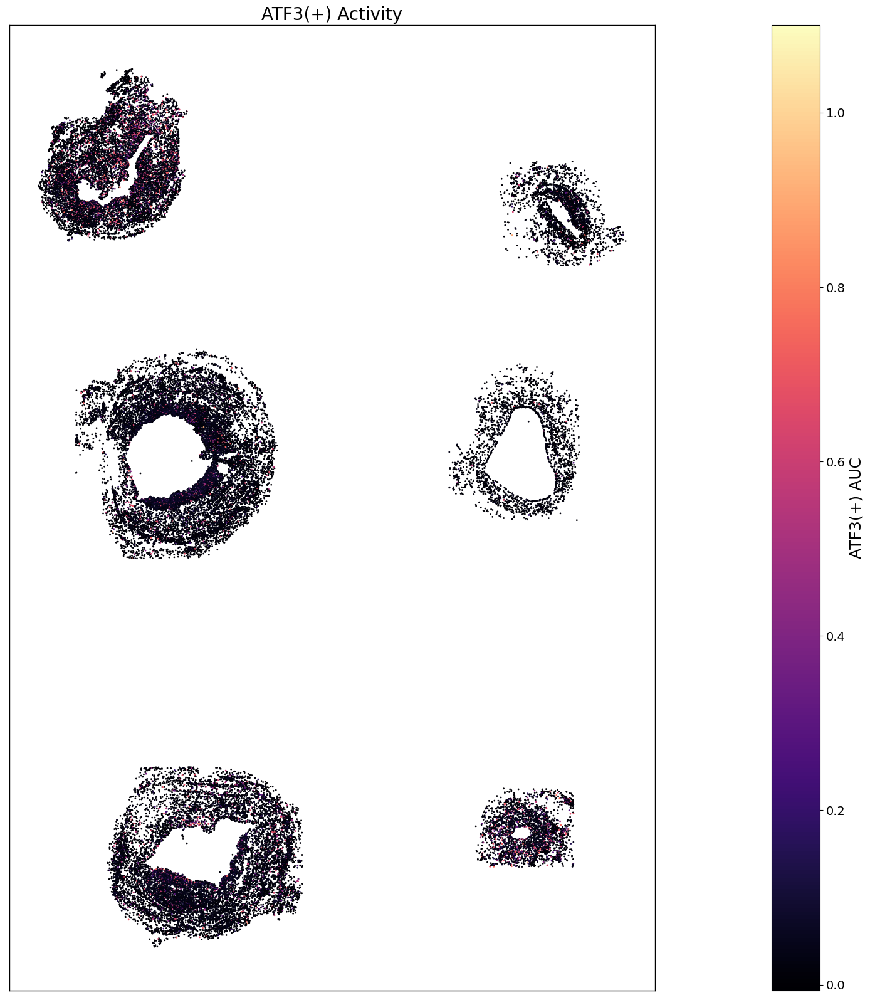

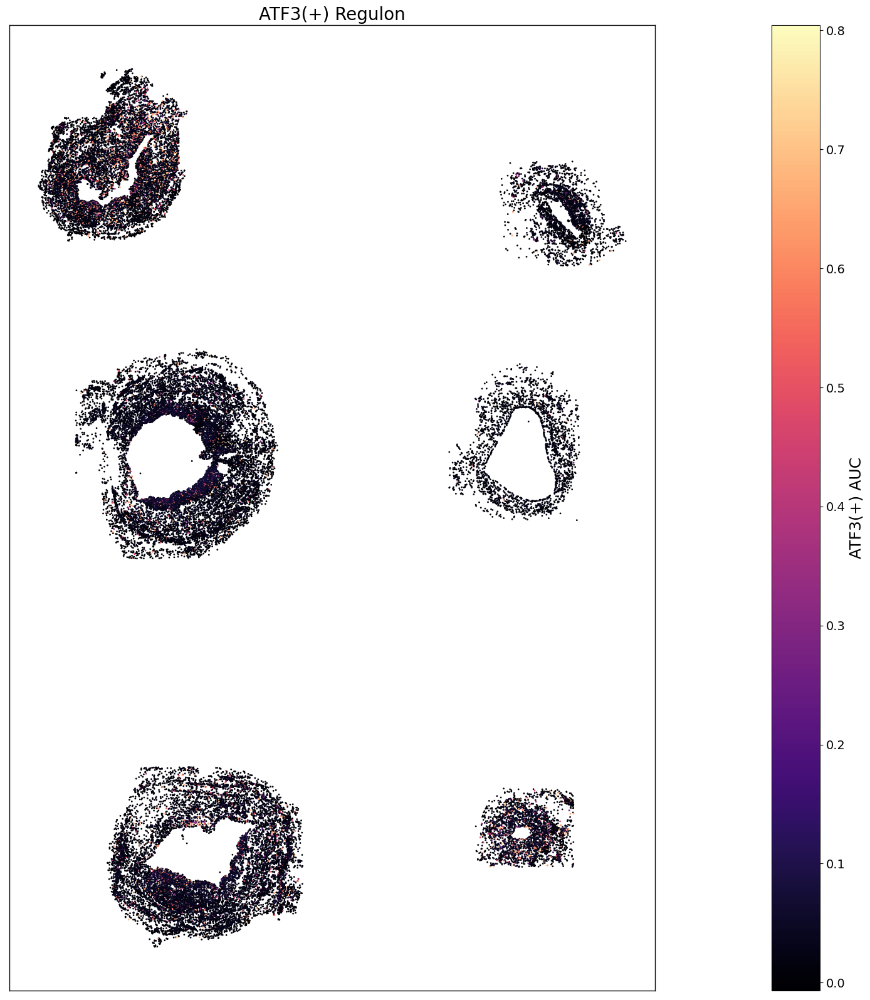

In [14]:
from spagrn.plot_Regulon import plot_spatial_auc

#In tissue space

#Plot regulon receptors ('rep_auc_mtx')
plot_spatial_auc(seu, 
                seu.obsm['rep_auc_mtx'], 
                'ATF3', 
                subset=False, 
                #subset_column='Sample', 
                #sample='AVF_354',
                dot_size=1, figure_size=(24, 20))

#Plot regulon receptors ('isr')
plot_spatial_auc(seu, 
                seu.obsm['isr'], 
                'ATF3(+)', 
                subset=False, 
                #subset_column='Sample', 
                #sample='AVF_354',
                dot_size=1, figure_size=(24, 20))


#Plot regulon ('auc_mtx')
plot_spatial_auc(seu, 
                seu.obsm['auc_mtx'], 
                'ATF3(+)', 
                subset=False, 
                #subset_column='Sample', 
                #sample='AVF_354',
                dot_size=1, figure_size=(24, 20))


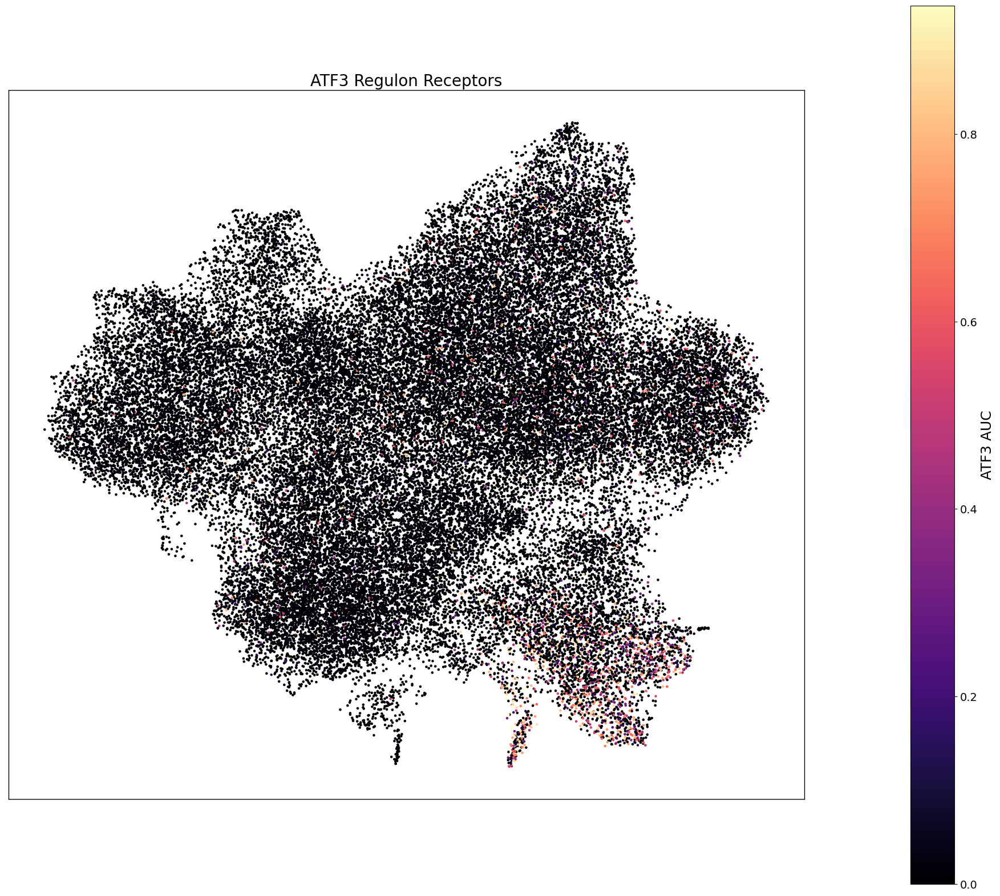

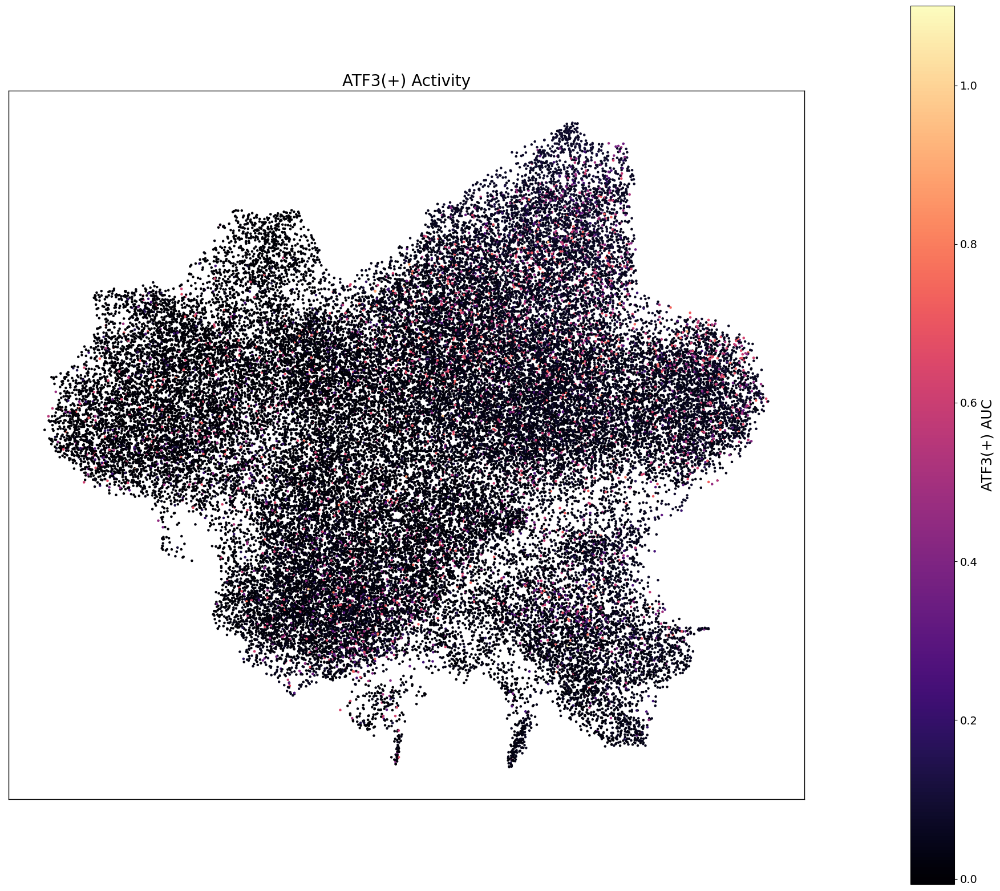

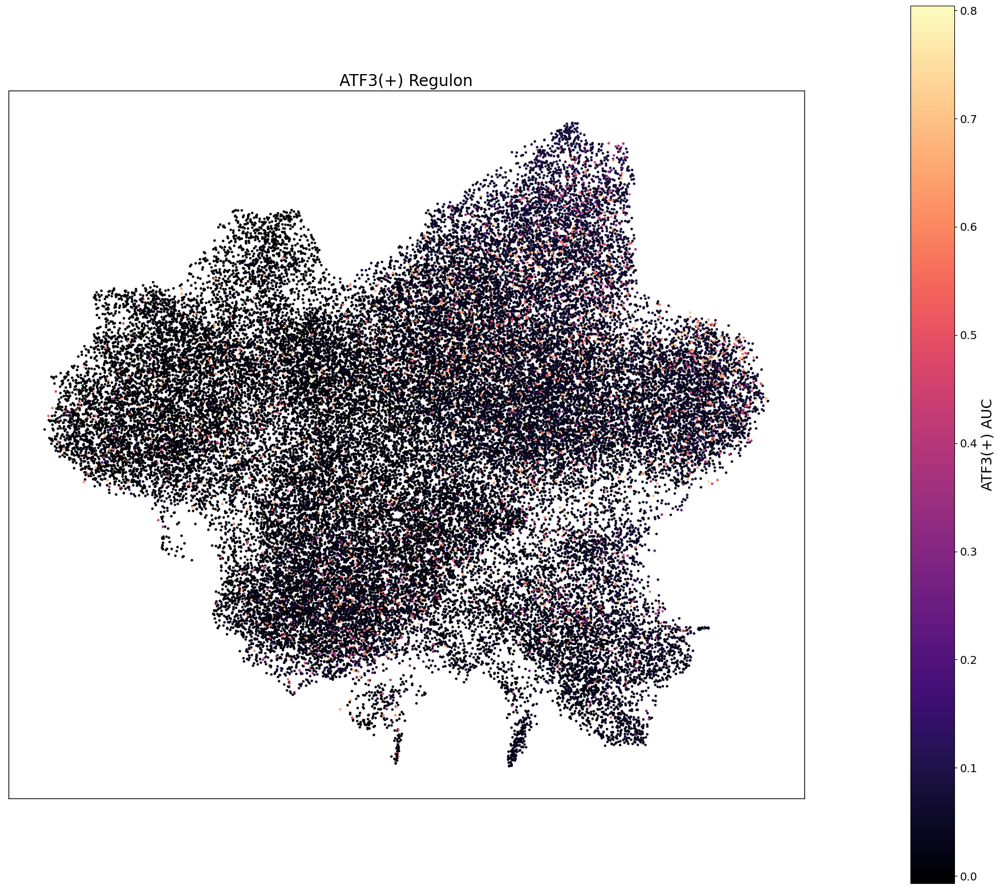

In [15]:
from spagrn.plot_Regulon import plot_spatial_auc

#In tissue space

#Plot regulon receptors ('rep_auc_mtx')
plot_spatial_auc(seu, 
                seu.obsm['rep_auc_mtx'], 
                'ATF3', 
                subset=False, 
                #subset_column='Sample', 
                #sample='AVF_354',
                spatial_layer='X_umap',
                dot_size=5, figure_size=(24, 20))

#Plot regulon receptors ('isr')
plot_spatial_auc(seu, 
                seu.obsm['isr'], 
                'ATF3(+)', 
                subset=False, 
                #subset_column='Sample', 
                #sample='AVF_354',
                spatial_layer='X_umap',
                dot_size=5, figure_size=(24, 20))


#Plot regulon ('auc_mtx')
plot_spatial_auc(seu, 
                seu.obsm['auc_mtx'], 
                'ATF3(+)', 
                subset=False, 
                #subset_column='Sample', 
                #sample='AVF_354',
                spatial_layer='X_umap',
                dot_size=5, figure_size=(24, 20))


Layered layout - Receptors: 4, TFs: 1, Targets: 5
Generated 10 positions
Layout type: layered
Edge length scale: 0.5
Number of nodes positioned: 10
Receptor nodes: 4
TF nodes: 1
Target nodes: 5
Position range - X: [-1.50, 1.50], Y: [-1.25, 1.25]


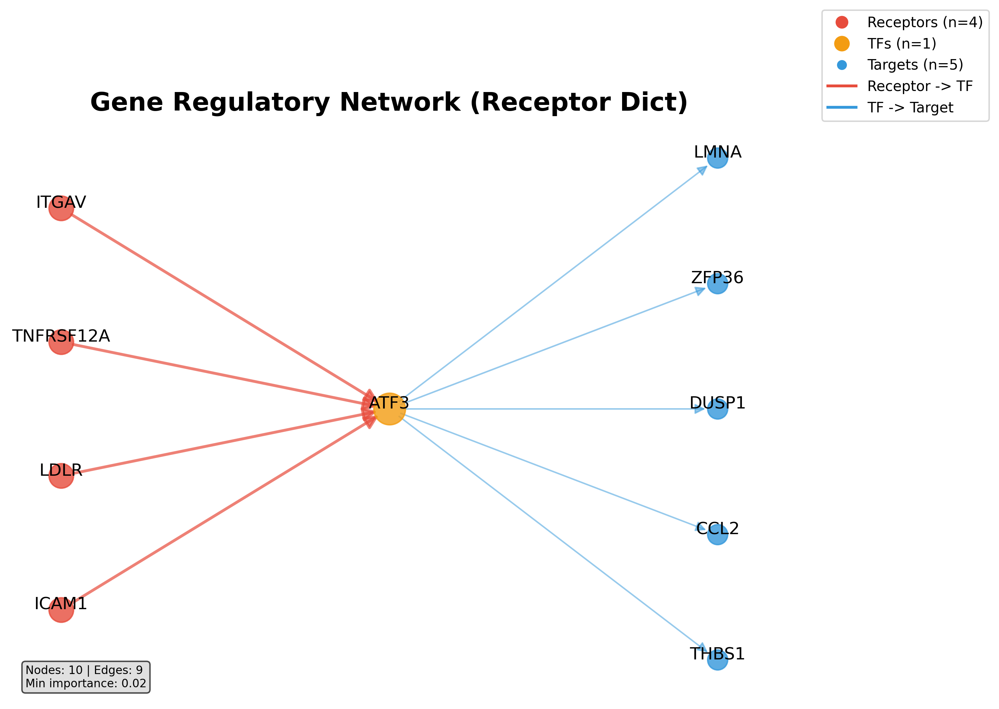

In [18]:
# Focus on specific TFs 
fig, G = plot_grn_network(
    seu,
    receptor_source='receptor_dict',
    selected_tfs=['ATF3',],
    min_importance=0.02,
    figsize = (10, 7),
    edge_length_scale = 0.5,
    )

In [19]:
seu.uns['regulon_dict']

{'ATF3(+)': ['LMNA',
  'THBS1',
  'MEG3',
  'C11orf96',
  'IL6',
  'PDGFA',
  'IER3',
  'CDKN1A',
  'COL18A1',
  'ATF3',
  'DUSP1',
  'ACTA2',
  'COL4A1',
  'FN1',
  'CCL2',
  'CALD1',
  'TPM2',
  'VIM',
  'COL4A2',
  'INHBA',
  'ZFP36',
  'COL1A2',
  'RGS2',
  'PFN1',
  'NEAT1',
  'TGFB3',
  'IGFBP7',
  'COL6A2',
  'TPM1',
  'ITGA5'],
 'CLOCK(+)': ['TUBB', 'FYN', 'S100A10', 'CSF1R', 'YBX3', 'ACKR3', 'VEGFA'],
 'ETS1(+)': ['BTG1',
  'IGF2',
  'BST2',
  'PDGFB',
  'VWA1',
  'TNFRSF1B',
  'TNFSF10',
  'ACKR1',
  'RGCC',
  'PFN1',
  'CEACAM8',
  'CCND1',
  'ACVRL1',
  'NDRG1',
  'CXCL12',
  'IFITM1',
  'JAG1',
  'ISG15',
  'ITGB1',
  'CALM2',
  'RPL22',
  'CALM1',
  'GLUL',
  'SPRY4',
  'YES1',
  'ENG',
  'HMGN2'],
 'FOS(+)': ['RGCC',
  'COL5A3',
  'CCND1',
  'PTGDS',
  'NOTCH3',
  'MEG3',
  'HMGN2',
  'IGF2',
  'IFITM3',
  'RARRES2',
  'IL6',
  'GPX3',
  'VWA1',
  'NOTCH1',
  'CDKN1A',
  'NEAT1',
  'CD81',
  'ARF1',
  'TUBB4B',
  'CXCL12',
  'BTG1',
  'LMNA',
  'PDGFA',
  'COL6A1',
  'MX

In [20]:
seu.uns['receptor_dict']

{'CLOCK': ['TLR2', 'SMO', 'IL7R', 'SIGLEC8', 'CLEC4A', 'TNFRSF1A'],
 'HEY1': ['TLR2',
  'SMO',
  'IL7R',
  'SIGLEC8',
  'CLEC4A',
  'TNFRSF1A',
  'PECAM1',
  'ACKR3',
  'TIE1'],
 'STAT6': ['ANXA2',
  'CD63',
  'EPHB4',
  'LDLR',
  'TNFRSF1B',
  'CD37',
  'CLDN2',
  'TGFBR2',
  'ESAM',
  'CEACAM8',
  'SORT1',
  'MMP14',
  'C5AR1',
  'CD9',
  'PDGFRB',
  'NOTCH1',
  'ACVRL1',
  'MCL1',
  'ADGRG1',
  'CD68',
  'SDC1',
  'CD81',
  'ITGA5',
  'ENG',
  'PECAM1',
  'CD74',
  'TNFRSF14',
  'SIGIRR'],
 'ATF3': ['ICAM1', 'LDLR', 'TNFRSF12A', 'ITGAV'],
 'GFI1': ['CD68', 'VSIR', 'CD74'],
 'SPI1': ['CD53', 'CD163', 'CD68', 'TNFRSF14', 'HCST', 'C5AR1', 'SIGIRR'],
 'FOS': ['ANXA2',
  'CD63',
  'LTBR',
  'CD37',
  'IL6ST',
  'CLDN2',
  'CEACAM8',
  'IL4R',
  'ESAM',
  'SORT1',
  'MMP14',
  'C5AR1',
  'BCL2',
  'CD276',
  'IL10RB',
  'MRC2',
  'CD68',
  'VSIR',
  'IL6R',
  'TIE1',
  'ENG',
  'PECAM1',
  'CD74',
  'RAMP2',
  'IL11RA',
  'TYROBP'],
 'POU5F1': ['ADGRG3',
  'IL27RA',
  'RYK',
  'FFAR2',
  

In [ ]:
seu.uns['receptor_dict_all']

{'ATF3': array(['SORT1'], dtype=object),
 'FOS': array(['PECAM1', 'SORT1', 'CD81', 'MMP2', 'CD74'], dtype=object),
 'JUN': array(['PECAM1', 'SORT1', 'CD81', 'MMP2', 'CD74'], dtype=object),
 'JUNB': array(['PECAM1', 'SORT1', 'TNFRSF1A', 'CD81', 'MMP2', 'CD74'],
       dtype=object),
 'KLF2': array(['PECAM1', 'SORT1', 'CDH5', 'TNFRSF1A', 'CD81', 'CD74'],
       dtype=object),
 'KLF4': array(['CD81', 'MMP2'], dtype=object),
 'MYC': array(['PECAM1', 'SORT1', 'CDH5', 'CD74', 'CD19'], dtype=object),
 'TCF7': array(['SMO', 'TLR2', 'CLEC4A', 'CSF1R', 'IL7R', 'TNFRSF1A', 'CD81',
        'ACKR3', 'SIGLEC8'], dtype=object)}

In [13]:
seu.uns['receptors_all']

array(['PECAM1', 'SMO', 'TLR2', 'SORT1', 'CDH5', 'CLEC4A', 'CSF1R',
       'IL7R', 'TNFRSF1A', 'CD81', 'ACKR3', 'SIGLEC8', 'MMP2', 'CD74',
       'CD19'], dtype=object)

In [10]:
seu

AnnData object with n_obs × n_vars = 49430 × 989
    obs: 'nCount_RNA', 'nFeature_RNA', 'fov', 'nCount_negprobes', 'nFeature_negprobes', 'Area', 'AspectRatio', 'Width', 'Height', 'CenterX_global_px', 'CenterY_global_px', 'Mean.PanCK', 'Max.PanCK', 'Mean.G', 'Max.G', 'Mean.Membrane', 'Max.Membrane', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'AtmxCluster', 'percent.NegPrb', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'coarse_annotation', 'Sample', 'condition', 'AVF', 'FBL_SMC', 'n_counts', '_scvi_batch', '_scvi_labels', 'leiden_0.5', 'leiden_niche_0.5', 'leiden_niche_1.0', 'leiden_niche_0.7', 'ATF3_exp', 'proliferation_score', 'ATF3_related_score', 'total_counts', 'Module 1', 'Module 2', 'Module 3', 'Module 4', 'Module 5', 'Module 6', 'Module 7', 'Module 8', 'n_genes'
    var: 'r2_z', 'r2_s', 'mean', 'std', 'n_cells', 'n_counts'
    uns: 'ATF3_exp_colors', 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'adj', 'coarse_annotation_colors', 'dendrogram_leiden_niche_0.5', '